# Setup

In [ ]:
!pip install keras_cv

In [ ]:
!pip install ultralytics

In [3]:
import os

os.environ["KERAS_BACKEND"] = "jax"  # @param ["tensorflow", "jax", "torch"]

from tensorflow import data as tf_data
import tensorflow_datasets as tfds
import keras
import keras_cv
import numpy as np
from keras_cv import bounding_box
import os
from keras_cv import visualization
import tqdm

Using JAX backend.


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Convert video to frames

In [ ]:
import cv2
vidcap = cv2.VideoCapture('Man_Ch_demo.mp4')
success,image = vidcap.read()
count = 0
while success:
  cv2.imwrite("/content/drive/MyDrive/frames/frame%d.jpg" % count, image)     # save frame as JPEG file
  success,image = vidcap.read()
  print('Read a new frame: ', success)
  count += 1

# first model - yolo_v8_m_pascalvoc

In [ ]:
pretrained_model = keras_cv.models.YOLOV8Detector.from_preset(
    "yolo_v8_m_pascalvoc", bounding_box_format="xywh"
)

100%|██████████| 2.27k/2.27k [00:00<00:00, 3.44MB/s]
100%|██████████| 99.5M/99.5M [00:01<00:00, 66.4MB/s]
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids
/usr/local/lib/python3.10/dist-packages/keras_cv/src/models/task.py:43: UserWarning: `layer.updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  return id(getattr(self, attr)) not in self._functional_layer_ids


In [ ]:
filepath = "/content/drive/MyDrive/frames/frame0.jpg"
image = keras.utils.load_img(filepath)
image = np.array(image)


inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

image_batch = inference_resizing([image])

y_pred = pretrained_model.predict(image_batch)
# y_pred is a bounding box Tensor:
# {"classes": ..., boxes": ...}
output = visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 265),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=15,
    font_scale=0.5,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
    )

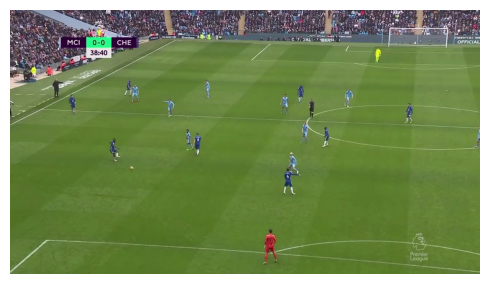

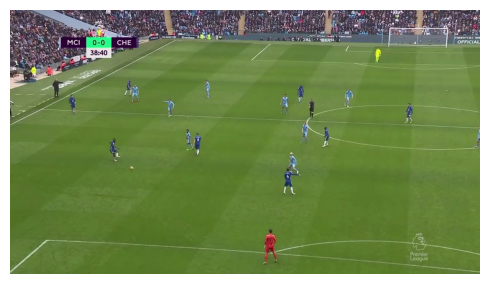

In [ ]:
filepath = "/content/drive/MyDrive/frames/frame0.jpg"
image = keras.utils.load_img(filepath)
image = np.array(image)

visualization.plot_image_gallery(
    np.array([image]),
    value_range=(0, 256),
    rows=1,
    cols=1,
    scale=5,
)


In [ ]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

In [ ]:
image_batch = inference_resizing([image])

In [ ]:
class_ids = [
    "Aeroplane",
    "Bicycle",
    "Bird",
    "Boat",
    "Bottle",
    "Bus",
    "Car",
    "Cat",
    "Chair",
    "Cow",
    "Dining Table",
    "Dog",
    "Horse",
    "Motorbike",
    "Person",
    "Potted Plant",
    "Sheep",
    "Sofa",
    "Train",
    "Tvmonitor",
    "Total",
]
class_mapping = dict(zip(range(len(class_ids)), class_ids))

1/1 [==============================] - 0s 224ms/step


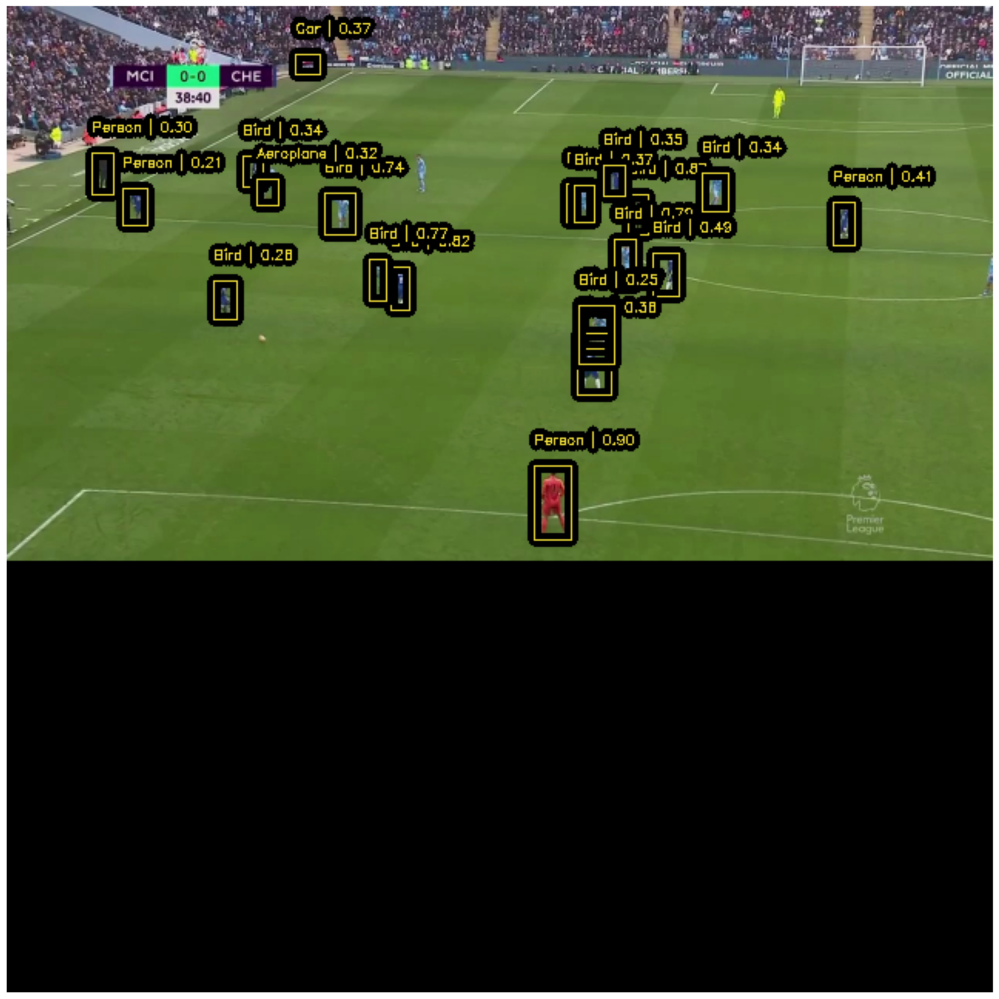

In [ ]:
y_pred = pretrained_model.predict(image_batch)
# y_pred is a bounding box Tensor:
# {"classes": ..., boxes": ...}
output = visualization.plot_bounding_box_gallery(
    image_batch,
    value_range=(0, 265),
    rows=1,
    cols=1,
    y_pred=y_pred,
    scale=15,
    font_scale=0.3,
    bounding_box_format="xywh",
    class_mapping=class_mapping,
    line_thickness=1
    )

In [ ]:
import matplotlib.pyplot as plt
output.savefig("/content/drive/MyDrive/output/frame0.jpg", format='jpg')

loop through and annotate each frame

In [ ]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, pad_to_aspect_ratio=True, bounding_box_format="xywh"
)

# Loop through each frame from 0 to 450
for i in range(450):
    # Construct the filepath for the current frame
    filepath = f"/content/drive/MyDrive/frames/frame{i}.jpg"

    # Load the image using keras
    image = keras.utils.load_img(filepath)
    image = np.array(image)

    # Resize the image using Resizing layer
    image_batch = inference_resizing([image])

    # Perform prediction
    y_pred = pretrained_model.predict(image_batch)

    # Plot bounding boxes on the image
    output = visualization.plot_bounding_box_gallery(
        image_batch,
        value_range=(0, 265),
        rows=1,
        cols=1,
        y_pred=y_pred,
        scale=15,
        font_scale=0.3,
        bounding_box_format="xywh",
        class_mapping=class_mapping,
        line_thickness=1
    )

    # Save the output image
    output.savefig(f"/content/drive/MyDrive/output/output_frame{i}.jpg", format='jpg')

Compile frames into a video

In [ ]:
import cv2
import os

# Directory containing frames
frames_dir = "/content/drive/MyDrive/output"

# Specify the output video file path
output_video_path = "/content/drive/MyDrive/output_video.mp4"

# Video codec and frame rate
codec = cv2.VideoWriter_fourcc(*"MP4V")
fps = 30

# Get the dimensions of the first frame to set up the video writer
first_frame_path = os.path.join(frames_dir, "output_frame0.jpg")
first_frame = cv2.imread(first_frame_path)
height, width, _ = first_frame.shape

# Create the video writer object
out = cv2.VideoWriter(output_video_path, codec, fps, (width, height))

# Iterate through each frame and write it to the video
i = 0
while True:
    frame_path = os.path.join(frames_dir, f"output_frame{i}.jpg")
    if not os.path.exists(frame_path):
        break
    frame = cv2.imread(frame_path)
    out.write(frame)
    i += 1

# Release the video writer object
out.release()

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/drive/MyDrive/output_video.mp4"

# Compressed video path
compressed_path = "/content/drive/MyDrive/output_video_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=1280 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# Second model - yolov8n

In [6]:
from ultralytics import YOLO
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow

In [7]:
model = YOLO('yolov8n.pt')

100%|██████████| 6.23M/6.23M [00:00<00:00, 82.3MB/s]


In [11]:
model = YOLO('/content/drive/MyDrive/yolov8n.pt')

100%|██████████| 6.23M/6.23M [00:00<00:00, 53.7MB/s]


Test image

In [12]:
results = model.predict('/content/drive/MyDrive/frames/frame0.jpg')


image 1/1 /content/drive/MyDrive/frames/frame0.jpg: 384x640 21 persons, 192.9ms
Speed: 2.2ms preprocess, 192.9ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


In [20]:
results[0].boxes[0].xyxy

tensor([689.3851, 597.5267, 730.9827, 694.0110], device='cuda:0')

In [ ]:
for i, r in enumerate(results):
    # Plot results image
    im_bgr = r.plot()  # BGR-order numpy array
    im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image
    # Show results to screen (in supported environments)
    r.show()
    r.save(filename=f'/content/drive/MyDrive/test{i}.jpg')

Loop through each frame

In [ ]:
for i in range(450):
  results = model.predict(f'/content/drive/MyDrive/frames/frame{i}.jpg', conf = 0.5, line_width = 1)
  for d, r in enumerate(results):
    im_bgr = r.plot()  # BGR-order numpy array
    im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image
    r.save(filename=f'/content/drive/MyDrive/yolo_v8_results/output_frame{i}.jpg')

Convert into video

In [ ]:
import cv2
import os

# Directory containing frames
frames_dir = "/content/drive/MyDrive/yolo_v8_results"

# Specify the output video file path
output_video_path = "/content/drive/MyDrive/yolo_v8_video.mp4"

# Video codec and frame rate
codec = cv2.VideoWriter_fourcc(*"MP4V")
fps = 30

# Get the dimensions of the first frame to set up the video writer
first_frame_path = os.path.join(frames_dir, "output_frame0.jpg")
first_frame = cv2.imread(first_frame_path)
height, width, _ = first_frame.shape

# Create the video writer object
out = cv2.VideoWriter(output_video_path, codec, fps, (width, height))

# Iterate through each frame and write it to the video
i = 0
while True:
    frame_path = os.path.join(frames_dir, f"output_frame{i}.jpg")
    if not os.path.exists(frame_path):
        break
    frame = cv2.imread(frame_path)
    out.write(frame)
    i += 1

# Release the video writer object
out.release()

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/drive/MyDrive/yolov8_video.mp4"

# Compressed video path
compressed_path = "/content/drive/MyDrive/yolov8_video_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=1280 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# Third Model - Ball and player joint detection

In [ ]:
model = YOLO('/content/drive/MyDrive/best.pt')

In [ ]:
results = model.predict('/content/drive/MyDrive/frames/frame0.jpg', conf = 0.5, line_width = 1)

## Explore the structure of the ouput

Corners of the bounding boxes

In [ ]:
for result in results:
  boxes = result.boxes
  conf = result.boxes

x1, y1, x2, y2 = boxes.xyxy[1]
x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

corners

[(744, 433), (776, 433), (776, 504), (744, 504)]

Display the orginal image from the output

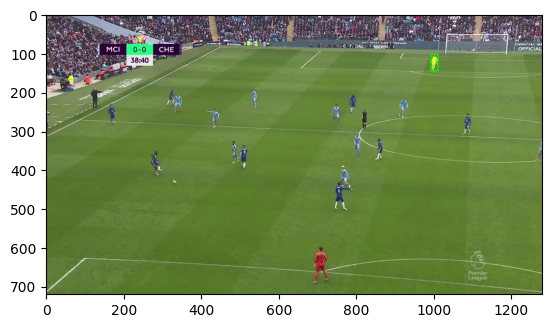

In [ ]:
import matplotlib.pyplot as plt
import cv2
# Load the image from the NumPy array

x1, y1, x2, y2 = boxes.xyxy[3]
x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

image = results[0].orig_img
image = np.transpose(image, (0,1,2))
img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

top_left = (x1, y1)
bottom_right = (x2, y2)

# Convert the image to RGB format
img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Draw the rectangle on the image
cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
# Display the image using matplotlib
plt.imshow(img_rgb)
plt.show()

Display from the folder

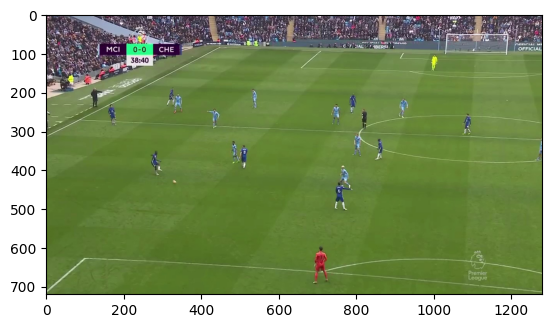

In [ ]:
img = cv2.imread('/content/drive/MyDrive/frames/frame0.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

In [ ]:
import cv2
import os

# Directory containing frames
frames_dir = "/content/drive/MyDrive/yolo_spec_results"

# Specify the output video file path
output_video_path = "/content/drive/MyDrive/yolospec_video.mp4"

# Video codec and frame rate
codec = cv2.VideoWriter_fourcc(*"MP4V")
fps = 30

# Get the dimensions of the first frame to set up the video writer
first_frame_path = os.path.join(frames_dir, "output_frame0.jpg")
first_frame = cv2.imread(first_frame_path)
height, width, _ = first_frame.shape

# Create the video writer object
out = cv2.VideoWriter(output_video_path, codec, fps, (width, height))

# Iterate through each frame and write it to the video
i = 0
while True:
    frame_path = os.path.join(frames_dir, f"output_frame{i}.jpg")
    if not os.path.exists(frame_path):
        break
    frame = cv2.imread(frame_path)
    out.write(frame)
    i += 1

# Release the video writer object
out.release()

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/drive/MyDrive/yolospec_video.mp4"

# Compressed video path
compressed_path = "/content/drive/MyDrive/yolospec_video_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=1280 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

Summary of the results at the point:

- The first model cannot identify all objects of interest in the frame. Actually it fails to identify a significant number of players in the frame.

- The second model can identify almost every player in the frame. One problem is that it is not trained to detect the ball in the frame.

However, it is extremely time-consuming to build a training data set on our own by labeling each objects of interest, and there is no well-structured, high-quality dataset on this task. Fortunately, we found a model that can successfully detect the ball.

Currently, it is in fact not very crucial that the pretrained model has to provide the correct labeling: as long as it is able to draw decent bounding boxes for each objects of interest, we can customize the labeling and other classification tasks on our own.

# First stage progress in classifying the team

It is important to note that the pretrained model only classify between human and objects, it does not classify between players or teams. For the classfication between teams, we could try to classify by the color of the jerseys

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image

model = YOLO('/content/drive/MyDrive/best.pt')

# Jersey color

team1 = 'Chelsea'
ch_g = [192, 54, 69]
ch_p = [46, 69, 121]
team2 = 'Manchester City'
man_g = [237,255,42]
man_p = [144,170,187]

## Basic labeling and team classification

In [ ]:
for i in range(450):
  # prediction
  results = model.predict(f'/content/drive/MyDrive/frames/frame{i}.jpg', conf = 0.5, line_width = 1)
  # pull out the elements in the output
  boxes = results[0].boxes
  image = results[0].orig_img
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  for d in range(len(boxes.xyxy)):
    if boxes.cls[d].cpu().numpy() == 0:
      # save the corners of bounding boxes
      x1, y1, x2, y2 = boxes.xyxy[d]
      x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
      corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

      top_left = (x1, y1)
      bottom_right = (x2, y2)

      center_x = (x1 + x2) // 2
      center_y = (y1 + y2) // 2

      # save the color channels for future comparison
      rgb = []
      for e in [0,1,2]:
        channel_data = image[center_y, center_x, e]
        rgb.append(channel_data)

      col_diff = []
      # calculate the color difference
      for f in [ch_g, ch_p, man_g, man_p]:
        col_diff.append(np.linalg.norm(np.array(rgb) - np.array(f)))

      # classification based on the euclidean distance between the color vectors of the center pixel and the pre-specified one
      for g in range(len(col_diff)):
        if min(col_diff) == col_diff[g]:
          if g>=2:
            cv2.putText(image, f'{team2}' + f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (man_p[0],man_p[1],man_p[2]), 1)
            cv2.rectangle(image, top_left, bottom_right, (man_p[0],man_p[1],man_p[2]), 1)
          else:
            cv2.putText(image, f'{team1}' + f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (ch_p[0],ch_p[1],ch_p[2]), 1)
            cv2.rectangle(image, top_left, bottom_right, (ch_p[0],ch_p[1],ch_p[2]), 1)

    if boxes.cls[d].cpu().numpy() == 1:
      x1, y1, x2, y2 = boxes.xyxy[d]
      x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
      corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

      top_left = (x1, y1)
      bottom_right = (x2, y2)

      cv2.rectangle(image, top_left, bottom_right, (0, 0, 0), 2)
      cv2.putText(image, f'Ref'+ f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,0,0), 1)

    if boxes.cls[d].cpu().numpy() == 2:
      x1, y1, x2, y2 = boxes.xyxy[d]
      x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
      corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

      top_left = (x1, y1)
      bottom_right = (x2, y2)

      cv2.rectangle(image, top_left, bottom_right, (160, 160, 160), 2)
      cv2.putText(image, 'Ball'+ f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (160,160,160), 1)

  image = Image.fromarray(image)
  image.save(f'/content/drive/MyDrive/yolo_spec_team_results/output_frame{i}.jpg',format='JPEG')



sample result

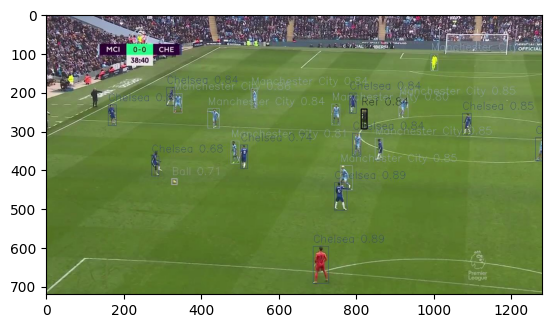

In [ ]:
img = cv2.imread('/content/drive/MyDrive/yolo_spec_team_results/output_frame0.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

In [ ]:
import cv2
import os

# Directory containing frames
frames_dir = "/content/drive/MyDrive/yolo_spec_team_results"

# Specify the output video file path
output_video_path = "/content/drive/MyDrive/yolospec_team_video.mp4"

# Video codec and frame rate
codec = cv2.VideoWriter_fourcc(*"MP4V")
fps = 30

# Get the dimensions of the first frame to set up the video writer
first_frame_path = os.path.join(frames_dir, "output_frame0.jpg")
first_frame = cv2.imread(first_frame_path)
height, width, _ = first_frame.shape

# Create the video writer object
out = cv2.VideoWriter(output_video_path, codec, fps, (width, height))

# Iterate through each frame and write it to the video
i = 0
while True:
    frame_path = os.path.join(frames_dir, f"output_frame{i}.jpg")
    if not os.path.exists(frame_path):
        break
    frame = cv2.imread(frame_path)
    out.write(frame)
    i += 1

# Release the video writer object
out.release()

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/drive/MyDrive/yolospec_team_video.mp4"

# Compressed video path
compressed_path = "/content/drive/MyDrive/yolospec_team_video_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=1280 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

For the classification of players, it is much harder because in the current view of the soccer field, it is very difficult to distinguish between each player by face recognition technique or other methods such as by the number on the jersey, since the player is moving all the time. One potential solution is to make decision on the distance between the bounding boxes of two consecutive frames. Two bounding boxes that are very close to each other are more likely to belong to the same player.

## Team classificaiton along with player/ball tracking

In [ ]:
# create 22 player lists for saving the bounding boxes for each
for j in range(22):
  locals()[f'player_{j}'] = []

ref = []

ball = []

for i in range(450):
  results = model.predict(f'/content/drive/MyDrive/frames/frame{i}.jpg', conf = 0.5, line_width = 1)
  boxes = results[0].boxes
  image = results[0].orig_img
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  # Save the first bounding boxes for each
  if i == 0:
    for d in range(len(boxes.xyxy)):
      if boxes.cls[d].numpy() == 0:
        x1, y1, x2, y2 = boxes.xyxy[d]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        top_left = (x1, y1)
        bottom_right = (x2, y2)
        TL = [x1, y1]
        BR = [x2, y2]

        locals()[f'player_{d}'].append([TL, BR])

        center_x = (x1 + x2) // 2
        center_y = (y1 + y2) // 2

        rgb = []
        for e in [0,1,2]:
          channel_data = image[center_y, center_x, e]
          rgb.append(channel_data)

        col_diff = []
        # calculate the color difference
        for f in [ch_g, ch_p, man_g, man_p]:
          col_diff.append(np.linalg.norm(np.array(rgb) - np.array(f)))

        for g in range(len(col_diff)):
          if min(col_diff) == col_diff[g]:
            if g>=2:
              cv2.putText(image, f'{team2}' + f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (man_p[0],man_p[1],man_p[2]), 1)
              cv2.rectangle(image, top_left, bottom_right, (man_p[0],man_p[1],man_p[2]), 1)
            else:
              cv2.putText(image, f'{team1}' + f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (ch_p[0],ch_p[1],ch_p[2]), 1)
              cv2.rectangle(image, top_left, bottom_right, (ch_p[0],ch_p[1],ch_p[2]), 1)

      if boxes.cls[d].numpy() == 1:
        x1, y1, x2, y2 = boxes.xyxy[d]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        top_left = (x1, y1)
        bottom_right = (x2, y2)
        TL = [x1, y1]
        BR = [x2, y2]
        ref.append([TL, BR])

        cv2.rectangle(image, top_left, bottom_right, (0, 0, 0), 2)
        cv2.putText(image, f'Ref'+ f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,0,0), 1)

      if boxes.cls[d].numpy() == 2:
        x1, y1, x2, y2 = boxes.xyxy[d]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        top_left = (x1, y1)
        bottom_right = (x2, y2)
        TL = [x1, y1]
        BR = [x2, y2]
        ball.append([TL, BR])

        cv2.rectangle(image, top_left, bottom_right, (160, 160, 160), 2)
        cv2.putText(image, 'Ball'+ f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (160,160,160), 1)

  # for the rest of the iterations, we take the difference between each bounding boxes in the latest frame and each bounding boxes in the previous frame
  if i != 0:
    for e in range(len(boxes.xyxy)):
      if boxes.cls[d].numpy() == 0:
        x1, y1, x2, y2 = boxes.xyxy[e]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        top_left = (x1, y1)
        bottom_right = (x2, y2)


        center_x = (x1 + x2) // 2
        center_y = (y1 + y2) // 2

        rgb = []
        for e in [0,1,2]:
          channel_data = image[center_y, center_x, e]
          rgb.append(channel_data)

        col_diff = []
        # calculate the color difference
        for f in [ch_g, ch_p, man_g, man_p]:
          col_diff.append(np.linalg.norm(np.array(rgb) - np.array(f)))

        for g in range(len(col_diff)):
          if min(col_diff) == col_diff[g]:
            if g>=2:
              cv2.putText(image, f'{team2}' + f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (man_p[0],man_p[1],man_p[2]), 1)
              cv2.rectangle(image, top_left, bottom_right, (man_p[0],man_p[1],man_p[2]), 1)
            else:
              cv2.putText(image, f'{team1}' + f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (ch_p[0],ch_p[1],ch_p[2]), 1)
              cv2.rectangle(image, top_left, bottom_right, (ch_p[0],ch_p[1],ch_p[2]), 1)

      if boxes.cls[d].numpy() == 1:
        x1, y1, x2, y2 = boxes.xyxy[d]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        top_left = (x1, y1)
        bottom_right = (x2, y2)
        TL = [x1, y1]
        BR = [x2, y2]
        ref.append([TL, BR])

        cv2.rectangle(image, top_left, bottom_right, (0, 0, 0), 2)
        cv2.putText(image, f'Ref'+ f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,0,0), 1)

      if boxes.cls[d].numpy() == 2:
        x1, y1, x2, y2 = boxes.xyxy[d]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        top_left = (x1, y1)
        bottom_right = (x2, y2)
        TL = [x1, y1]
        BR = [x2, y2]
        ball.append([TL, BR])

        cv2.rectangle(image, top_left, bottom_right, (160, 160, 160), 2)
        cv2.putText(image, 'Ball'+ f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (160,160,160), 1)

  image = Image.fromarray(image)
  image.save(f'/content/drive/MyDrive/yolo_spec_team_results/output_frame{i}.jpg',format='JPEG')


## Save the tracking data

In [ ]:
import pickle

for j in range(22):
  with open(f'/content/drive/MyDrive/player_{j}.pkl', 'wb') as f:
    pickle.dump(locals()[f'player_{j}'], f)

with open(f'/content/drive/MyDrive/ball.pkl', 'wb') as f:
  pickle.dump(ball, f)

with open(f'/content/drive/MyDrive/ref.pkl', 'wb') as f:
  pickle.dump(ref, f)

In [76]:
import pickle
for j in range(22):
  with open(f'/content/drive/MyDrive/player_{j}.pkl', 'rb') as f:
      locals()[f'player_{j}'] = pickle.load(f)

with open('/content/drive/MyDrive/ball.pkl', 'rb') as f:
      ball_0 = pickle.load(f)

Most of the time, this method works well, but when two players are very close to each other, this method lost track of the player and may classify other play's bounding boxes to another player. We can see the folloing examples:

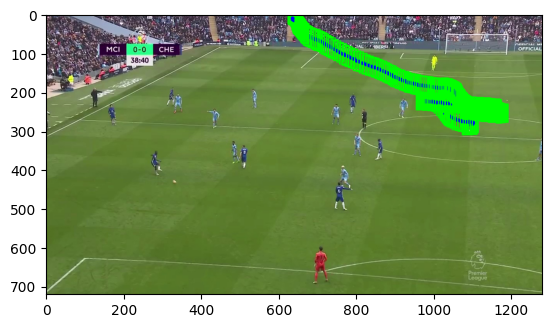

In [ ]:
img = cv2.imread(f'/content/drive/MyDrive/frames/frame0.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
j=5
for i in range(450):
  if all(item is not None for item in locals()[f'player_{j}'][i][0]):
    top_left = tuple(locals()[f'player_{j}'][i][0])
    bottom_right = tuple(locals()[f'player_{j}'][i][1])

    # Draw the rectangle on the image
    cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
    center_x = (locals()[f'player_{j}'][i][0][0] + locals()[f'player_{j}'][i][1][0]) // 2
    center_y = (locals()[f'player_{j}'][i][0][1] + locals()[f'player_{j}'][i][1][1]) // 2
    cv2.circle(img_rgb, (center_x, center_y), 5, (0, 0, 255), -1)

plt.imshow(img_rgb)
plt.show()

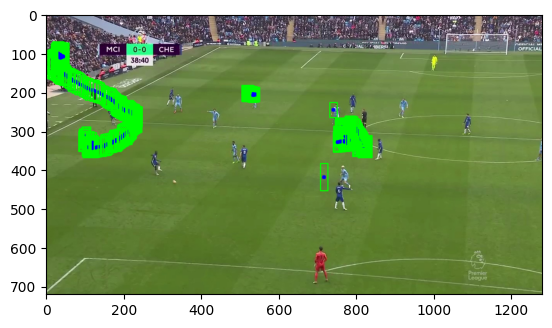

In [ ]:
img = cv2.imread(f'/content/drive/MyDrive/frames/frame0.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
j=12
for i in range(450):
  if all(item is not None for item in locals()[f'player_{j}'][i][0]):
    top_left = tuple(locals()[f'player_{j}'][i][0])
    bottom_right = tuple(locals()[f'player_{j}'][i][1])

    # Draw the rectangle on the image
    cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
    center_x = (locals()[f'player_{j}'][i][0][0] + locals()[f'player_{j}'][i][1][0]) // 2
    center_y = (locals()[f'player_{j}'][i][0][1] + locals()[f'player_{j}'][i][1][1]) // 2
    cv2.circle(img_rgb, (center_x, center_y), 5, (0, 0, 255), -1)

plt.imshow(img_rgb)
plt.show()

Because this is only one ball, the tracking works very well for it

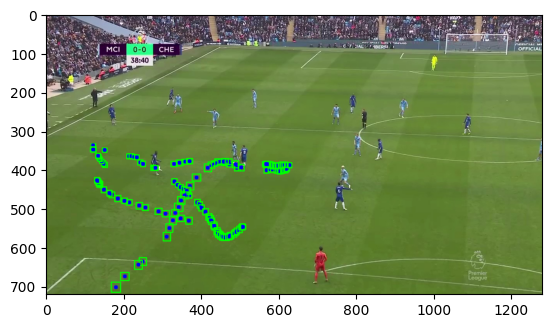

In [77]:
img = cv2.imread('/content/drive/MyDrive/frames/frame0.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

for i in range(450):
  # Exclude frames when
  if all(item is not None for item in ball_0[i][0]):
    top_left = tuple(ball_0[i][0])
    bottom_right = tuple(ball_0[i][1])

    # Draw the rectangle on the image
    cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
    center_x = (ball_0[i][0][0] + ball_0[i][1][0]) // 2
    center_y = (ball_0[i][0][1] + ball_0[i][1][1]) // 2
    cv2.circle(img_rgb, (center_x, center_y), 5, (0, 0, 255), -1)

plt.imshow(img_rgb)
plt.show()

# Second stage progress in Tracking Visualization

For the visualization of tracking, we intend to visualize the bounding boxes of the current frame and last 4 bounding boxes of the same object in order to have a clearer visual sense of the trajectory of the displacement. The empty board is left for projection of the movement on the tactical board by homography for future work

## Player Tracking

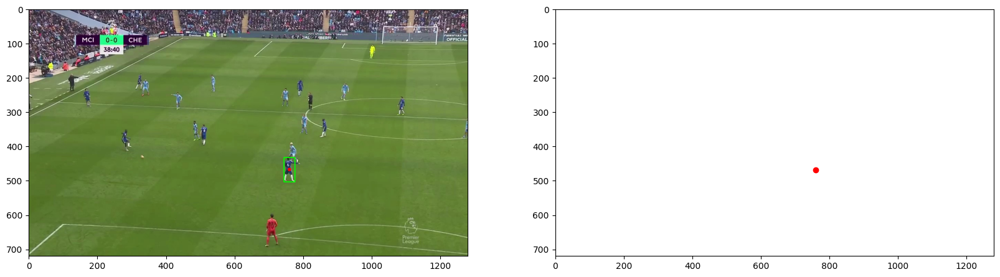

In [69]:
def white_image(img):
    white = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    white = cv2.rectangle(white, (0,0), (1280, 720), (255, 255, 255), -1)
    return white
# which player you want to track
player1 = []
# player6 = []
for i in range(1):
  img = cv2.imread(f'/content/drive/MyDrive/frames/frame{i}.jpg')
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  index=[1]
  empty = white_image(img)
  if i == 0:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'player{j}'].append(locals()[f'player_{j}'][i])
      top_left = tuple(locals()[f'player{j}'][i][0])
      bottom_right = tuple(locals()[f'player{j}'][i][1])

      # Draw the rectangle on the image
      if None in locals()[f'player{j}'][i][0]:
        center_x = None
        center_y = None
      else:
        cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
        center_x = (locals()[f'player{j}'][i][0][0] + locals()[f'player{j}'][i][1][0]) // 2
        center_y = (locals()[f'player{j}'][i][0][1] + locals()[f'player{j}'][i][1][1]) // 2
        cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    # axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')

    # save the image
    plt.savefig(f'/content/drive/MyDrive/player_output/player_output_frame{i}.jpg', format='jpg')

  if i == 1:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'player{j}'].append(locals()[f'player_{j}'][i])
      top_left = tuple(locals()[f'player{j}'][i][0])
      bottom_right = tuple(locals()[f'player{j}'][i][1])

      bottom_right_1 = tuple(locals()[f'player{j}'][i-1][1])
      top_left_1 = tuple(locals()[f'player{j}'][i-1][0])

      # Draw the rectangle on the image
      cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_1, bottom_right_1, (0, 255, 0), 2)
      if None in locals()[f'player{j}'][i][0]:
        center_x = None
        center_y = None
      else:
        center_x = (locals()[f'player{j}'][i][0][0] + locals()[f'player{j}'][i][1][0]) // 2
        center_y = (locals()[f'player{j}'][i][0][1] + locals()[f'player{j}'][i][1][1]) // 2
        cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][i-1][0]:
        center_x_1 = None
        center_y_1 = None
      else:
        center_x_1 = (locals()[f'player{j}'][i-1][0][0] + locals()[f'player{j}'][i-1][1][0]) // 2
        center_y_1 = (locals()[f'player{j}'][i-1][0][1] + locals()[f'player{j}'][i-1][1][1]) // 2

        cv2.circle(img_rgb, (center_x_1, center_y_1), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')
      axs[1].scatter(center_x_1, center_y_1, color='red')

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')
    # axs[1].scatter(center_x_1, center_y_1, color='red')
    # save the image
    plt.savefig(f'/content/drive/MyDrive/player_output/player_output_frame{i}.jpg', format='jpg')
    plt.show(block=False)
    plt.clf()
    plt.close(fig)


  if i == 2:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'player{j}'].append(locals()[f'player_{j}'][i])
      top_left = tuple(locals()[f'player{j}'][i][0])
      bottom_right = tuple(locals()[f'player{j}'][i][1])

      bottom_right_1 = tuple(locals()[f'player{j}'][i-1][1])
      top_left_1 = tuple(locals()[f'player{j}'][i-1][0])

      bottom_right_2 = tuple(locals()[f'player{j}'][i-2][1])
      top_left_2 = tuple(locals()[f'player{j}'][i-2][0])

      # Draw the rectangle on the image
      cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_1, bottom_right_1, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_2, bottom_right_2, (0, 255, 0), 2)

      if None in locals()[f'player{j}'][i][0]:
        center_x = None
        center_y = None
      else:
        center_x = (locals()[f'player{j}'][i][0][0] + locals()[f'player{j}'][i][1][0]) // 2
        center_y = (locals()[f'player{j}'][i][0][1] + locals()[f'player{j}'][i][1][1]) // 2
        cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][i-1][0]:
        center_x = None
        center_y = None
      else:
        center_x_1 = (locals()[f'player{j}'][i-1][0][0] + locals()[f'player{j}'][i-1][1][0]) // 2
        center_y_1 = (locals()[f'player{j}'][i-1][0][1] + locals()[f'player{j}'][i-1][1][1]) // 2

        cv2.circle(img_rgb, (center_x_1, center_y_1), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][i-2][0]:
        center_x = None
        center_y = None
      else:
        center_x_2 = (locals()[f'player{j}'][i-2][0][0] + locals()[f'player{j}'][i-2][1][0]) // 2
        center_y_2 = (locals()[f'player{j}'][i-2][0][1] + locals()[f'player{j}'][i-2][1][1]) // 2

        cv2.circle(img_rgb, (center_x_2, center_y_2), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')
      axs[1].scatter(center_x_1, center_y_1, color='red')
      axs[1].scatter(center_x_2, center_y_2, color='red')

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    # axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')
    # axs[1].scatter(center_x_1, center_y_1, color='red')
    # axs[1].scatter(center_x_2, center_y_2, color='red')
    # save the image
    plt.savefig(f'/content/drive/MyDrive/player_output/player_output_frame{i}.jpg', format='jpg')
    plt.show(block=False)
    plt.clf()
    plt.close(fig)

  if i == 3:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'player{j}'].append(locals()[f'player_{j}'][i])
      top_left = tuple(locals()[f'player{j}'][i][0])
      bottom_right = tuple(locals()[f'player{j}'][i][1])

      bottom_right_1 = tuple(locals()[f'player{j}'][i-1][1])
      top_left_1 = tuple(locals()[f'player{j}'][i-1][0])

      bottom_right_2 = tuple(locals()[f'player{j}'][i-2][1])
      top_left_2 = tuple(locals()[f'player{j}'][i-2][0])

      bottom_right_3 = tuple(locals()[f'player{j}'][i-3][1])
      top_left_3 = tuple(locals()[f'player{j}'][i-3][0])

      # Draw the rectangle on the image
      cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_1, bottom_right_1, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_2, bottom_right_2, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_3, bottom_right_3, (0, 255, 0), 2)

      if None in locals()[f'player{j}'][i][0]:
        center_x = None
        center_y = None
      else:
        center_x = (locals()[f'player{j}'][i][0][0] + locals()[f'player{j}'][i][1][0]) // 2
        center_y = (locals()[f'player{j}'][i][0][1] + locals()[f'player{j}'][i][1][1]) // 2
        cv2.circle(img_rgb, (center_x, center_y), 5, (0, 0, 255), -1)

      if None in locals()[f'player{j}'][i-1][0]:
        center_x = None
        center_y = None
      else:
        center_x_1 = (locals()[f'player{j}'][i-1][0][0] + locals()[f'player{j}'][i-1][1][0]) // 2
        center_y_1 = (locals()[f'player{j}'][i-1][0][1] + locals()[f'player{j}'][i-1][1][1]) // 2

        cv2.circle(img_rgb, (center_x_1, center_y_1), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][i-2][0]:
        center_x = None
        center_y = None
      else:
        center_x_2 = (locals()[f'player{j}'][i-2][0][0] + locals()[f'player{j}'][i-2][1][0]) // 2
        center_y_2 = (locals()[f'player{j}'][i-2][0][1] + locals()[f'player{j}'][i-2][1][1]) // 2

        cv2.circle(img_rgb, (center_x_2, center_y_2), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][i-3][0]:
        center_x = None
        center_y = None
      else:
        center_x_3 = (locals()[f'player{j}'][i-3][0][0] + locals()[f'player{j}'][i-3][1][0]) // 2
        center_y_3 = (locals()[f'player{j}'][i-3][0][1] + locals()[f'player{j}'][i-3][1][1]) // 2

        cv2.circle(img_rgb, (center_x_3, center_y_3), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')
      axs[1].scatter(center_x_1, center_y_1, color='red')
      axs[1].scatter(center_x_2, center_y_2, color='red')
      axs[1].scatter(center_x_3, center_y_3, color='red')

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    # axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')
    # axs[1].scatter(center_x_1, center_y_1, color='red')
    # axs[1].scatter(center_x_2, center_y_2, color='red')
    # axs[1].scatter(center_x_3, center_y_3, color='red')

    # save the image
    plt.savefig(f'/content/drive/MyDrive/player_output/player_output_frame{i}.jpg', format='jpg')
    plt.show(block=False)
    plt.clf()
    plt.close(fig)

  if i > 3:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'player{j}'].append(locals()[f'player_{j}'][i])
      locals()[f'player{j}'].remove(locals()[f'player_{j}'][i-4])
      y = -1
      top_left = tuple(locals()[f'player{j}'][y][0])
      bottom_right = tuple(locals()[f'player{j}'][y][1])

      bottom_right_1 = tuple(locals()[f'player{j}'][y-1][1])
      top_left_1 = tuple(locals()[f'player{j}'][y-1][0])

      bottom_right_2 = tuple(locals()[f'player{j}'][y-2][1])
      top_left_2 = tuple(locals()[f'player{j}'][y-2][0])

      bottom_right_3 = tuple(locals()[f'player{j}'][y-3][1])
      top_left_3 = tuple(locals()[f'player{j}'][y-3][0])

      # bottom_right_4 = tuple(player[y-4][1])
      # top_left_4 = tuple(player[y-4][0])

      # Draw the rectangle on the image
      cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_1, bottom_right_1, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_2, bottom_right_2, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_3, bottom_right_3, (0, 255, 0), 2)
      # cv2.rectangle(img_rgb, top_left_4, bottom_right_4, (0, 255, 0), 2)
      if None in locals()[f'player{j}'][y][0]:
        center_x = None
        center_y = None
      else:
        center_x = (locals()[f'player{j}'][y][0][0] + locals()[f'player{j}'][y][1][0]) // 2
        center_y = (locals()[f'player{j}'][y][0][1] + locals()[f'player{j}'][y][1][1]) // 2
        cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][y-1][0]:
        center_x = None
        center_y = None
      else:
        center_x_1 = (locals()[f'player{j}'][y-1][0][0] + locals()[f'player{j}'][y-1][1][0]) // 2
        center_y_1 = (locals()[f'player{j}'][y-1][0][1] + locals()[f'player{j}'][y-1][1][1]) // 2

        cv2.circle(img_rgb, (center_x_1, center_y_1), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][y-2][0]:
        center_x = None
        center_y = None
      else:
        center_x_2 = (locals()[f'player{j}'][y-2][0][0] + locals()[f'player{j}'][y-2][1][0]) // 2
        center_y_2 = (locals()[f'player{j}'][y-2][0][1] + locals()[f'player{j}'][y-2][1][1]) // 2

        cv2.circle(img_rgb, (center_x_2, center_y_2), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][y-3][0]:
        center_x = None
        center_y = None
      else:
        center_x_3 = (locals()[f'player{j}'][y-3][0][0] + locals()[f'player{j}'][y-3][1][0]) // 2
        center_y_3 = (locals()[f'player{j}'][y-3][0][1] + locals()[f'player{j}'][y-3][1][1]) // 2

        cv2.circle(img_rgb, (center_x_3, center_y_3), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')
      axs[1].scatter(center_x_1, center_y_1, color='red')
      axs[1].scatter(center_x_2, center_y_2, color='red')
      axs[1].scatter(center_x_3, center_y_3, color='red')
    # center_x_4 = (player[i-4][0][0] + player[i-4][1][0]) // 2
    # center_y_4 = (player[i-4][0][1] + player[i-4][1][1]) // 2

    # cv2.circle(img_rgb, (center_x_4, center_y_4), 5, (255, 0, 0), -1)

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    # axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')
    # axs[1].scatter(center_x_1, center_y_1, color='red')
    # axs[1].scatter(center_x_2, center_y_2, color='red')
    # axs[1].scatter(center_x_3, center_y_3, color='red')
    # axs[1].scatter(center_x_4, center_y_4, color='red')
    # save the image
    plt.savefig(f'/content/drive/MyDrive/player_output/player_output_frame{i}.jpg', format='jpg')
    plt.show(block=False)
    plt.clf()
    plt.close(fig)


In [ ]:
import cv2
import os

# Directory containing frames
frames_dir = "/content/drive/MyDrive/player_output"

# Specify the output video file path
output_video_path = "/content/drive/MyDrive/yolospec_player_video.mp4"

# Video codec and frame rate
codec = cv2.VideoWriter_fourcc(*"MP4V")
fps = 30

# Get the dimensions of the first frame to set up the video writer
first_frame_path = os.path.join(frames_dir, "player_output_frame0.jpg")
first_frame = cv2.imread(first_frame_path)
height, width, _ = first_frame.shape

# Create the video writer object
out = cv2.VideoWriter(output_video_path, codec, fps, (width, height))

# Iterate through each frame and write it to the video
i = 0
while True:
    frame_path = os.path.join(frames_dir, f"player_output_frame{i}.jpg")
    if not os.path.exists(frame_path):
        break
    frame = cv2.imread(frame_path)
    out.write(frame)
    i += 1

# Release the video writer object
out.release()

In [87]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/drive/MyDrive/yolospec_player_video1.mp4"

# Compressed video path
compressed_path = "/content/drive/MyDrive/yolospec_player_video1_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=1280 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## Ball Tracking

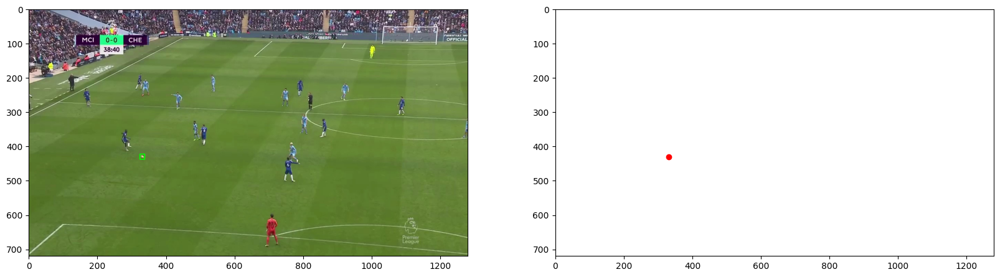

In [86]:
def white_image(img):
    white = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    white = cv2.rectangle(white, (0,0), (1280, 720), (255, 255, 255), -1)
    return white
# which ball you want to track
ball0 = []
# ball6 = []
for i in range(1):
  img = cv2.imread(f'/content/drive/MyDrive/frames/frame{i}.jpg')
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  index=[0]
  empty = white_image(img)
  if i == 0:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'ball{j}'].append(locals()[f'ball_{j}'][i])
      top_left = tuple(locals()[f'ball{j}'][i][0])
      bottom_right = tuple(locals()[f'ball{j}'][i][1])

      # Draw the rectangle on the image
      if None in locals()[f'ball{j}'][i][0]:
        center_x = None
        center_y = None
      else:
        cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
        center_x = (locals()[f'ball{j}'][i][0][0] + locals()[f'ball{j}'][i][1][0]) // 2
        center_y = (locals()[f'ball{j}'][i][0][1] + locals()[f'ball{j}'][i][1][1]) // 2
        # cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    # axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')

    # save the image
    plt.savefig(f'/content/drive/MyDrive/ball_output/ball_output_frame{i}.jpg', format='jpg')

  if i == 1:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'ball{j}'].append(locals()[f'ball_{j}'][i])
      top_left = tuple(locals()[f'ball{j}'][i][0])
      bottom_right = tuple(locals()[f'ball{j}'][i][1])

      bottom_right_1 = tuple(locals()[f'ball{j}'][i-1][1])
      top_left_1 = tuple(locals()[f'ball{j}'][i-1][0])

      # Draw the rectangle on the image
      cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_1, bottom_right_1, (0, 255, 0), 2)
      if None in locals()[f'ball{j}'][i][0]:
        center_x = None
        center_y = None
      else:
        center_x = (locals()[f'ball{j}'][i][0][0] + locals()[f'ball{j}'][i][1][0]) // 2
        center_y = (locals()[f'ball{j}'][i][0][1] + locals()[f'ball{j}'][i][1][1]) // 2
        # cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)

      if None in locals()[f'ball{j}'][i-1][0]:
        center_x_1 = None
        center_y_1 = None
      else:
        center_x_1 = (locals()[f'ball{j}'][i-1][0][0] + locals()[f'ball{j}'][i-1][1][0]) // 2
        center_y_1 = (locals()[f'ball{j}'][i-1][0][1] + locals()[f'ball{j}'][i-1][1][1]) // 2

        # cv2.circle(img_rgb, (center_x_1, center_y_1), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')
      axs[1].scatter(center_x_1, center_y_1, color='red')

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')
    # axs[1].scatter(center_x_1, center_y_1, color='red')
    # save the image
    plt.savefig(f'/content/drive/MyDrive/ball_output/ball_output_frame{i}.jpg', format='jpg')
    plt.show(block=False)
    plt.clf()
    plt.close(fig)


  if i == 2:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'ball{j}'].append(locals()[f'ball_{j}'][i])
      top_left = tuple(locals()[f'ball{j}'][i][0])
      bottom_right = tuple(locals()[f'ball{j}'][i][1])

      bottom_right_1 = tuple(locals()[f'ball{j}'][i-1][1])
      top_left_1 = tuple(locals()[f'ball{j}'][i-1][0])

      bottom_right_2 = tuple(locals()[f'ball{j}'][i-2][1])
      top_left_2 = tuple(locals()[f'ball{j}'][i-2][0])

      # Draw the rectangle on the image
      cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_1, bottom_right_1, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_2, bottom_right_2, (0, 255, 0), 2)

      if None in locals()[f'ball{j}'][i][0]:
        center_x = None
        center_y = None
      else:
        center_x = (locals()[f'ball{j}'][i][0][0] + locals()[f'ball{j}'][i][1][0]) // 2
        center_y = (locals()[f'ball{j}'][i][0][1] + locals()[f'ball{j}'][i][1][1]) // 2
        # cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)

      if None in locals()[f'ball{j}'][i-1][0]:
        center_x = None
        center_y = None
      else:
        center_x_1 = (locals()[f'ball{j}'][i-1][0][0] + locals()[f'ball{j}'][i-1][1][0]) // 2
        center_y_1 = (locals()[f'ball{j}'][i-1][0][1] + locals()[f'ball{j}'][i-1][1][1]) // 2

        # cv2.circle(img_rgb, (center_x_1, center_y_1), 5, (255, 0, 0), -1)

      if None in locals()[f'ball{j}'][i-2][0]:
        center_x = None
        center_y = None
      else:
        center_x_2 = (locals()[f'ball{j}'][i-2][0][0] + locals()[f'ball{j}'][i-2][1][0]) // 2
        center_y_2 = (locals()[f'ball{j}'][i-2][0][1] + locals()[f'ball{j}'][i-2][1][1]) // 2

        # cv2.circle(img_rgb, (center_x_2, center_y_2), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')
      axs[1].scatter(center_x_1, center_y_1, color='red')
      axs[1].scatter(center_x_2, center_y_2, color='red')

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    # axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')
    # axs[1].scatter(center_x_1, center_y_1, color='red')
    # axs[1].scatter(center_x_2, center_y_2, color='red')
    # save the image
    plt.savefig(f'/content/drive/MyDrive/ball_output/ball_output_frame{i}.jpg', format='jpg')
    plt.show(block=False)
    plt.clf()
    plt.close(fig)

  if i == 3:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'ball{j}'].append(locals()[f'ball_{j}'][i])
      top_left = tuple(locals()[f'ball{j}'][i][0])
      bottom_right = tuple(locals()[f'ball{j}'][i][1])

      bottom_right_1 = tuple(locals()[f'ball{j}'][i-1][1])
      top_left_1 = tuple(locals()[f'ball{j}'][i-1][0])

      bottom_right_2 = tuple(locals()[f'ball{j}'][i-2][1])
      top_left_2 = tuple(locals()[f'ball{j}'][i-2][0])

      bottom_right_3 = tuple(locals()[f'ball{j}'][i-3][1])
      top_left_3 = tuple(locals()[f'ball{j}'][i-3][0])

      # Draw the rectangle on the image
      cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_1, bottom_right_1, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_2, bottom_right_2, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_3, bottom_right_3, (0, 255, 0), 2)

      if None in locals()[f'ball{j}'][i][0]:
        center_x = None
        center_y = None
      else:
        center_x = (locals()[f'ball{j}'][i][0][0] + locals()[f'ball{j}'][i][1][0]) // 2
        center_y = (locals()[f'ball{j}'][i][0][1] + locals()[f'ball{j}'][i][1][1]) // 2
        # cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)

      if None in locals()[f'ball{j}'][i-1][0]:
        center_x = None
        center_y = None
      else:
        center_x_1 = (locals()[f'ball{j}'][i-1][0][0] + locals()[f'ball{j}'][i-1][1][0]) // 2
        center_y_1 = (locals()[f'ball{j}'][i-1][0][1] + locals()[f'ball{j}'][i-1][1][1]) // 2

        # cv2.circle(img_rgb, (center_x_1, center_y_1), 5, (255, 0, 0), -1)

      if None in locals()[f'ball{j}'][i-2][0]:
        center_x = None
        center_y = None
      else:
        center_x_2 = (locals()[f'ball{j}'][i-2][0][0] + locals()[f'ball{j}'][i-2][1][0]) // 2
        center_y_2 = (locals()[f'ball{j}'][i-2][0][1] + locals()[f'ball{j}'][i-2][1][1]) // 2

        # cv2.circle(img_rgb, (center_x_2, center_y_2), 5, (255, 0, 0), -1)

      if None in locals()[f'ball{j}'][i-3][0]:
        center_x = None
        center_y = None
      else:
        center_x_3 = (locals()[f'ball{j}'][i-3][0][0] + locals()[f'ball{j}'][i-3][1][0]) // 2
        center_y_3 = (locals()[f'ball{j}'][i-3][0][1] + locals()[f'ball{j}'][i-3][1][1]) // 2

        # cv2.circle(img_rgb, (center_x_3, center_y_3), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')
      axs[1].scatter(center_x_1, center_y_1, color='red')
      axs[1].scatter(center_x_2, center_y_2, color='red')
      axs[1].scatter(center_x_3, center_y_3, color='red')

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    # axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')
    # axs[1].scatter(center_x_1, center_y_1, color='red')
    # axs[1].scatter(center_x_2, center_y_2, color='red')
    # axs[1].scatter(center_x_3, center_y_3, color='red')

    # save the image
    plt.savefig(f'/content/drive/MyDrive/ball_output/ball_output_frame{i}.jpg', format='jpg')
    plt.show(block=False)
    plt.clf()
    plt.close(fig)

  if i > 3:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'ball{j}'].append(locals()[f'ball_{j}'][i])
      locals()[f'ball{j}'].remove(locals()[f'ball_{j}'][i-4])
      y = -1
      top_left = tuple(locals()[f'ball{j}'][y][0])
      bottom_right = tuple(locals()[f'ball{j}'][y][1])

      bottom_right_1 = tuple(locals()[f'ball{j}'][y-1][1])
      top_left_1 = tuple(locals()[f'ball{j}'][y-1][0])

      bottom_right_2 = tuple(locals()[f'ball{j}'][y-2][1])
      top_left_2 = tuple(locals()[f'ball{j}'][y-2][0])

      bottom_right_3 = tuple(locals()[f'ball{j}'][y-3][1])
      top_left_3 = tuple(locals()[f'ball{j}'][y-3][0])

      # bottom_right_4 = tuple(ball[y-4][1])
      # top_left_4 = tuple(ball[y-4][0])

      # Draw the rectangle on the image
      cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_1, bottom_right_1, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_2, bottom_right_2, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_3, bottom_right_3, (0, 255, 0), 2)
      # cv2.rectangle(img_rgb, top_left_4, bottom_right_4, (0, 255, 0), 2)
      if None in locals()[f'ball{j}'][y][0]:
        center_x = None
        center_y = None
      else:
        center_x = (locals()[f'ball{j}'][y][0][0] + locals()[f'ball{j}'][y][1][0]) // 2
        center_y = (locals()[f'ball{j}'][y][0][1] + locals()[f'ball{j}'][y][1][1]) // 2
        # cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)

      if None in locals()[f'ball{j}'][y-1][0]:
        center_x = None
        center_y = None
      else:
        center_x_1 = (locals()[f'ball{j}'][y-1][0][0] + locals()[f'ball{j}'][y-1][1][0]) // 2
        center_y_1 = (locals()[f'ball{j}'][y-1][0][1] + locals()[f'ball{j}'][y-1][1][1]) // 2

        # cv2.circle(img_rgb, (center_x_1, center_y_1), 5, (255, 0, 0), -1)

      if None in locals()[f'ball{j}'][y-2][0]:
        center_x = None
        center_y = None
      else:
        center_x_2 = (locals()[f'ball{j}'][y-2][0][0] + locals()[f'ball{j}'][y-2][1][0]) // 2
        center_y_2 = (locals()[f'ball{j}'][y-2][0][1] + locals()[f'ball{j}'][y-2][1][1]) // 2

        # cv2.circle(img_rgb, (center_x_2, center_y_2), 5, (255, 0, 0), -1)

      if None in locals()[f'ball{j}'][y-3][0]:
        center_x = None
        center_y = None
      else:
        center_x_3 = (locals()[f'ball{j}'][y-3][0][0] + locals()[f'ball{j}'][y-3][1][0]) // 2
        center_y_3 = (locals()[f'ball{j}'][y-3][0][1] + locals()[f'ball{j}'][y-3][1][1]) // 2

        # cv2.circle(img_rgb, (center_x_3, center_y_3), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')
      axs[1].scatter(center_x_1, center_y_1, color='red')
      axs[1].scatter(center_x_2, center_y_2, color='red')
      axs[1].scatter(center_x_3, center_y_3, color='red')
    # center_x_4 = (ball[i-4][0][0] + ball[i-4][1][0]) // 2
    # center_y_4 = (ball[i-4][0][1] + ball[i-4][1][1]) // 2

    # cv2.circle(img_rgb, (center_x_4, center_y_4), 5, (255, 0, 0), -1)

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    # axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')
    # axs[1].scatter(center_x_1, center_y_1, color='red')
    # axs[1].scatter(center_x_2, center_y_2, color='red')
    # axs[1].scatter(center_x_3, center_y_3, color='red')
    # axs[1].scatter(center_x_4, center_y_4, color='red')
    # save the image
    plt.savefig(f'/content/drive/MyDrive/ball_output/ball_output_frame{i}.jpg', format='jpg')
    plt.show(block=False)
    plt.clf()
    plt.close(fig)


In [85]:
import cv2
import os

# Directory containing frames
frames_dir = "/content/drive/MyDrive/ball_output"

# Specify the output video file path
output_video_path = "/content/drive/MyDrive/yolospec_ball_video.mp4"

# Video codec and frame rate
codec = cv2.VideoWriter_fourcc(*"MP4V")
fps = 30

# Get the dimensions of the first frame to set up the video writer
first_frame_path = os.path.join(frames_dir, "ball_output_frame0.jpg")
first_frame = cv2.imread(first_frame_path)
height, width, _ = first_frame.shape

# Create the video writer object
out = cv2.VideoWriter(output_video_path, codec, fps, (width, height))

# Iterate through each frame and write it to the video
i = 0
while True:
    frame_path = os.path.join(frames_dir, f"ball_output_frame{i}.jpg")
    if not os.path.exists(frame_path):
        break
    frame = cv2.imread(frame_path)
    out.write(frame)
    i += 1

# Release the video writer object
out.release()

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/drive/MyDrive/yolospec_ball_video.mp4"

# Compressed video path
compressed_path = "/content/drive/MyDrive/yolospec_ball_video_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=1280 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# Third stage progress in classifying players

To save time, we first save the resulting bounding boxes in lists to prevent run the model repeatedly

## Preproccessing

In [ ]:
for j in range(450):
  locals()[f'player_frame{j}'] = []

for j in range(450):
  locals()[f'ball_frame{j}'] = []

for j in range(450):
  locals()[f'ref_frame{j}'] = []


for i in range(450):
  results = model.predict(f'/content/drive/MyDrive/frames/frame{i}.jpg', conf = 0.5, line_width = 1)
  boxes = results[0].boxes
  image = results[0].orig_img
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  for d in range(len(boxes.xyxy)):
    if boxes.cls[d].numpy() == 0:
      x1, y1, x2, y2 = boxes.xyxy[d]
      x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
      corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

      top_left = (x1, y1)
      bottom_right = (x2, y2)
      TL = [x1, y1]
      BR = [x2, y2]
      locals()[f'player_frame{i}'].append([TL, BR])

    if boxes.cls[d].numpy() == 1:
      x1, y1, x2, y2 = boxes.xyxy[d]
      x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
      corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

      top_left = (x1, y1)
      bottom_right = (x2, y2)
      top_left = (x1, y1)
      bottom_right = (x2, y2)
      TL = [x1, y1]
      BR = [x2, y2]
      locals()[f'ref_frame{i}'].append([TL, BR])

    if boxes.cls[d].numpy() == 2:
      x1, y1, x2, y2 = boxes.xyxy[d]
      x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
      corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

      top_left = (x1, y1)
      bottom_right = (x2, y2)

      top_left = (x1, y1)
      bottom_right = (x2, y2)
      TL = [x1, y1]
      BR = [x2, y2]
      locals()[f'ball_frame{i}'].append([TL, BR])


  if not locals()[f'ball_frame{i}']:
    locals()[f'ball_frame{i}'].append([[None,None],[None,None]])
  if not locals()[f'player_frame{i}']:
    locals()[f'player_frame{i}'].append([[None,None],[None,None]])
  if not locals()[f'ref_frame{i}']:
    locals()[f'ref_frame{i}'].append([[None,None],[None,None]])

Save the bounding boxes

In [ ]:
for i in range(450):
  with open(f'/content/drive/MyDrive/ball_frame/ball_frame{i}.pkl', 'wb') as f:
    pickle.dump(locals()[f'ball_frame{i}'], f)

  with open(f'/content/drive/MyDrive/player_frame/player_frame{i}.pkl', 'wb') as f:
    pickle.dump(locals()[f'player_frame{i}'], f)

  with open(f'/content/drive/MyDrive/ref_frame/ref_frame{i}.pkl', 'wb') as f:
    pickle.dump(locals()[f'ref_frame{i}'], f)

Read bounding boxes

In [ ]:
for j in range(22):
  with open(f'/content/drive/MyDrive/player_frame/player_frame{i}.pkl', 'rb') as f:
      locals()[f'player_frame{i}'] = pickle.load(f)

  with open(f'/content/drive/MyDrive/ball_frame/ball_frame{i}.pkl', 'rb') as f:
      locals()[f'ball_frame{i}'] = pickle.load(f)

  with open(f'/content/drive/MyDrive/ref_frame/ref_frame{i}.pkl', 'rb') as f:
      locals()[f'ref_frame{i}'] = pickle.load(f)

## New Methods of classifying

We develop a new algorithm to prevent misclassifying boxes when players get closer to each other. Basically, we save the pair-wise difference between the bounding boxes in two consecutive frames till the end of each iteration. We let bounding boxes that have the smallest difference to be classified first: we assume that the closer the boxes the more likely that the bounding boxes are correctly assigned to each player. We then exclude the chosen boxes from the decision-making of the rest of the bounding boxes. This process ensure that when two player overlaps and one of the player is not detected - therefore does not have a bounding box - we do not count the closest bounding box of another player toward the target player. However, the pitfall is that there could be multiple overlaps or undetected players (usually less than 3-4, but still problematic) who are very close to each other, so during the next iteration the classification would be messed up.

In [ ]:
for j in range(22):
  locals()[f'player_{j}'] = []

ref = []

ball = []

for i in range(450):
  # results = model.predict(f'/content/drive/MyDrive/frames/frame{i}.jpg', conf = 0.5, line_width = 1)
  # boxes = results[0].boxes
  # image = results[0].orig_img
  # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  if i == 0:
    for d in range(len(locals()[f'player_frame{i}'])):
      if len(locals()[f'player_frame{i}']) != 0:
        TL, BR = locals()[f'player_frame{i}'][d]
        # x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        # corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        # top_left = (x1, y1)
        # bottom_right = (x2, y2)
        # TL = [x1, y1]
        # BR = [x2, y2]

        locals()[f'player_{d}'].append([TL, BR])

        # center_x = (x1 + x2) // 2
        # center_y = (y1 + y2) // 2

        # rgb = []
        # for e in [0,1,2]:
        #   channel_data = image[center_y, center_x, e]
        #   rgb.append(channel_data)

        # col_diff = []
        # # calculate the color difference
        # for f in [ch_g, ch_p, man_g, man_p]:
        #   col_diff.append(np.linalg.norm(np.array(rgb) - np.array(f)))

        # for g in range(len(col_diff)):
        #   if min(col_diff) == col_diff[g]:
        #     if g>=2:
        #       cv2.putText(image, f'{team2}' + f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (man_p[0],man_p[1],man_p[2]), 1)
        #       cv2.rectangle(image, top_left, bottom_right, (man_p[0],man_p[1],man_p[2]), 1)
        #     else:
        #       cv2.putText(image, f'{team1}' + f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (ch_p[0],ch_p[1],ch_p[2]), 1)
        #       cv2.rectangle(image, top_left, bottom_right, (ch_p[0],ch_p[1],ch_p[2]), 1)

    for d in range(len(locals()[f'ref_frame{i}'])):
      if len(locals()[f'ref_frame{i}']) != 0:
        TL, BR = locals()[f'ref_frame{i}'][d]
        # x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        # corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        # top_left = (x1, y1)
        # bottom_right = (x2, y2)
        # TL = [x1, y1]
        # BR = [x2, y2]
        ref.append([TL, BR])

        # cv2.rectangle(image, top_left, bottom_right, (0, 0, 0), 2)
        # cv2.putText(image, f'Ref'+ f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,0,0), 1)

    for d in range(len(locals()[f'ball_frame{i}'])):
      if len(locals()[f'ball_frame{i}']) != 0:
        TL, BR = locals()[f'ball_frame{i}'][d]
        # x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        # corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        # top_left = (x1, y1)
        # bottom_right = (x2, y2)
        # TL = [x1, y1]
        # BR = [x2, y2]
        ball.append([TL, BR])

        # cv2.rectangle(image, top_left, bottom_right, (160, 160, 160), 2)
        # cv2.putText(image, 'Ball'+ f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (160,160,160), 1)

    for play in range(22):
      if not locals()[f'player_{play}']:
        locals()[f'player_{play}'].append([[None, None], [None, None]])
    if not ref:
      ref.append([[None, None], [None, None]])
    if not ball:
      ball.append([[None, None], [None, None]])

  if i != 0:
    # create a list of integer from 0 to 21
    player_unselect = list(range(22))
    player_select = []
    ball_select = []
    ref_select = []
    # create frame_diff for each player
    for f in range(22):
      locals()[f'frame_diff_{f}'] = []
    for f in range(22):
      locals()[f'temp_player_{f}'] = []
    seq = 0
    for e in range(len(locals()[f'player_frame{i}'])):
      if len(locals()[f'player_frame{i}']) != 0:
        TL, BR = locals()[f'player_frame{i}'][e]
        # x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        # corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        # top_left = (x1, y1)
        # bottom_right = (x2, y2)
        # TL = [x1, y1]
        # BR = [x2, y2]

        locals()[f'temp_player_{seq}'].append([TL, BR])

        for f in range(22):
          # skip if fth local()[f'player_{f}'] contain None
          if None in locals()[f'player_{f}'][-1][0]:
            locals()[f'frame_diff_{seq}'].append(1280) # if none may be comparing with -2 frame for i >=2?
          else:
          # calculate the distance between the current box and the previous box
            # x1, y1, x2, y2 = boxes.xyxy[e]
            # TL = [x1, y1]
            # BR = [x2, y2]
            x1, y1 = TL[0], TL[1]
            x2, y2 = BR[0], BR[1]
            center_x = (x1 + x2) // 2
            center_y = (y1 + y2) // 2
            center_1 = [center_x, center_y]
            x11, y11 = locals()[f'player_{f}'][-1][0][0], locals()[f'player_{f}'][-1][0][1]
            x22, y22 = locals()[f'player_{f}'][-1][1][0], locals()[f'player_{f}'][-1][1][1]
            center_x1 = (x11 + x22) // 2
            center_y1 = (y11 + y22) // 2
            center_2 = [center_x1, center_y1]
            locals()[f'frame_diff_{seq}'].append(np.linalg.norm(np.array(locals()[f'player_{f}'][-1][0]) - np.array([TL])))
        seq = seq + 1

        # center_x = (x1 + x2) // 2
        # center_y = (y1 + y2) // 2

        # rgb = []
        # for k in [0,1,2]:
        #   channel_data = image[center_y, center_x, k]
        #   rgb.append(channel_data)

        # col_diff = []
        # # calculate the color difference
        # for f in [ch_g, ch_p, man_g, man_p]:
        #   col_diff.append(np.linalg.norm(np.array(rgb) - np.array(f)))

        # for g in range(len(col_diff)):
        #   if min(col_diff) == col_diff[g]:
        #     if g>=2:
        #       cv2.putText(image, f'{team2}' + f" {boxes.conf[e]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (man_p[0],man_p[1],man_p[2]), 1)
        #       cv2.rectangle(image, top_left, bottom_right, (man_p[0],man_p[1],man_p[2]), 1)
        #     else:
        #       cv2.putText(image, f'{team1}' + f" {boxes.conf[e]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (ch_p[0],ch_p[1],ch_p[2]), 1)

        #       cv2.rectangle(image, top_left, bottom_right, (ch_p[0],ch_p[1],ch_p[2]), 1)

    for e in range(len(locals()[f'ref_frame{i}'])):
      if len(locals()[f'ref_frame{i}']) != 0:
        TL, BR = locals()[f'ref_frame{i}'][e]
        # x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        # corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        # top_left = (x1, y1)
        # bottom_right = (x2, y2)
        # TL = [x1, y1]
        # BR = [x2, y2]
        ref.append([TL, BR])
        ref_select.append(1)

        # cv2.rectangle(image, top_left, bottom_right, (0, 0, 0), 2)
        # cv2.putText(image, f'Ref'+ f" {boxes.conf[e]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,0,0), 1)

    for e in range(len(locals()[f'ball_frame{i}'])):
      if len(locals()[f'ball_frame{i}']) != 0:
        TL, BR = locals()[f'ball_frame{i}'][e]
        # x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        # corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        # top_left = (x1, y1)
        # bottom_right = (x2, y2)
        # TL = [x1, y1]
        # BR = [x2, y2]
        ball.append([TL, BR])
        ball_select.append(1)

        # cv2.rectangle(image, top_left, bottom_right, (160, 160, 160), 2)
        # cv2.putText(image, 'Ball'+ f" {boxes.conf[e]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (160,160,160), 1)


    min_diff = []
    for f in range(22):
      # if temp_player is not empty
      if len(locals()[f'temp_player_{f}']) == 0:
        min_diff.append(1300)
      else:
        min_diff.append(min(locals()[f'frame_diff_{f}']))

    decision_list = []
    for _ in range(len(min_diff)):
      for h in range(22):
        if (min(min_diff) == min_diff[h]) & (min(min_diff)<1290):
          for z in range(22):
            if min_diff[h] == locals()[f'frame_diff_{h}'][z]:
              if z in player_unselect:
                locals()[f'player_{z}'].append(locals()[f'temp_player_{h}'][0])
                for y in range(22):
                  if len(locals()[f'frame_diff_{y}']) != 0:
                    locals()[f'frame_diff_{y}'][z] = 1290
                min_diff = []
                for f in range(22):
                  # if temp_player is not empty
                  if len(locals()[f'temp_player_{f}']) == 0:
                    min_diff.append(1300)
                  else:
                    min_diff.append(min(locals()[f'frame_diff_{f}']))
                decision_list.append(h)
                for r in decision_list:
                  min_diff[r] = 1290
                player_select.append(z)
                player_unselect.remove(z)



    for b in player_unselect:
      locals()[f'player_{b}'].append([[None, None], [None, None]])

    if not ref_select:
      ref.append([[None, None], [None, None]])
    if not ball_select:
      ball.append([[None, None], [None, None]])



  # image = Image.fromarray(image)
  # image.save(f'/content/drive/MyDrive/yolo_spec_team_results/output_frame{i}.jpg',format='JPEG')


Optional: if you want to run the model and draw the boxes/visualize (uncomment) while classifying

In [ ]:
for j in range(22):
  locals()[f'player_{j}'] = []

ref = []

ball = []

for i in range(450):
  results = model.predict(f'/content/drive/MyDrive/frames/frame{i}.jpg', conf = 0.5, line_width = 1)
  boxes = results[0].boxes
  image = results[0].orig_img
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  if i == 0:
    for d in range(len(boxes.xyxy)):
      if boxes.cls[d].cpu().numpy() == 0:
        x1, y1, x2, y2 = boxes.xyxy[d]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        top_left = (x1, y1)
        bottom_right = (x2, y2)
        TL = [x1, y1]
        BR = [x2, y2]

        locals()[f'player_{d}'].append([TL, BR])

        # center_x = (x1 + x2) // 2
        # center_y = (y1 + y2) // 2

        # rgb = []
        # for e in [0,1,2]:
        #   channel_data = image[center_y, center_x, e]
        #   rgb.append(channel_data)

        # col_diff = []
        # # calculate the color difference
        # for f in [ch_g, ch_p, man_g, man_p]:
        #   col_diff.append(np.linalg.norm(np.array(rgb) - np.array(f)))

        # for g in range(len(col_diff)):
        #   if min(col_diff) == col_diff[g]:
        #     if g>=2:
        #       cv2.putText(image, f'{team2}' + f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (man_p[0],man_p[1],man_p[2]), 1)
        #       cv2.rectangle(image, top_left, bottom_right, (man_p[0],man_p[1],man_p[2]), 1)
        #     else:
        #       cv2.putText(image, f'{team1}' + f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (ch_p[0],ch_p[1],ch_p[2]), 1)
        #       cv2.rectangle(image, top_left, bottom_right, (ch_p[0],ch_p[1],ch_p[2]), 1)

      if boxes.cls[d].cpu().numpy() == 1:
        x1, y1, x2, y2 = boxes.xyxy[d]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        top_left = (x1, y1)
        bottom_right = (x2, y2)
        TL = [x1, y1]
        BR = [x2, y2]
        ref.append([TL, BR])

        # cv2.rectangle(image, top_left, bottom_right, (0, 0, 0), 2)
        # cv2.putText(image, f'Ref'+ f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,0,0), 1)

      if boxes.cls[d].cpu().numpy() == 2:
        x1, y1, x2, y2 = boxes.xyxy[d]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        top_left = (x1, y1)
        bottom_right = (x2, y2)
        TL = [x1, y1]
        BR = [x2, y2]
        ball.append([TL, BR])

        # cv2.rectangle(image, top_left, bottom_right, (160, 160, 160), 2)
        # cv2.putText(image, 'Ball'+ f" {boxes.conf[d]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (160,160,160), 1)

    for play in range(22):
      if not locals()[f'player_{play}']:
        locals()[f'player_{play}'].append([[None, None], [None, None]])
    if not ref:
      ref.append([[None, None], [None, None]])
    if not ball:
      ball.append([[None, None], [None, None]])

  if i != 0:
    # create a list of integer from 0 to 21
    player_unselect = list(range(22))
    player_select = []
    ball_select = []
    ref_select = []
    # create frame_diff for each player
    for f in range(22):
      locals()[f'frame_diff_{f}'] = []
    for f in range(22):
      locals()[f'temp_player_{f}'] = []
    seq = 0
    for e in range(len(boxes.xyxy)):
      if boxes.cls[e].cpu().numpy() == 0:
        x1, y1, x2, y2 = boxes.xyxy[e]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        top_left = (x1, y1)
        bottom_right = (x2, y2)
        TL = [x1, y1]
        BR = [x2, y2]

        locals()[f'temp_player_{seq}'].append([TL, BR])

        for f in range(22):
          # skip if fth local()[f'player_{f}'] contain None
          if None in locals()[f'player_{f}'][-1][0]:
            locals()[f'frame_diff_{seq}'].append(1280)
          else:
          # calculate the distance between the current box and the previous box
            x1, y1, x2, y2 = boxes.xyxy[e]
            TL = [x1, y1]
            BR = [x2, y2]
            locals()[f'frame_diff_{seq}'].append(np.linalg.norm(np.array(locals()[f'player_{f}'][-1][0]) - np.array([TL])))
        seq = seq + 1

        # center_x = (x1 + x2) // 2
        # center_y = (y1 + y2) // 2

        # rgb = []
        # for k in [0,1,2]:
        #   channel_data = image[center_y, center_x, k]
        #   rgb.append(channel_data)

        # col_diff = []
        # # calculate the color difference
        # for f in [ch_g, ch_p, man_g, man_p]:
        #   col_diff.append(np.linalg.norm(np.array(rgb) - np.array(f)))

        # for g in range(len(col_diff)):
        #   if min(col_diff) == col_diff[g]:
        #     if g>=2:
        #       cv2.putText(image, f'{team2}' + f" {boxes.conf[e]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (man_p[0],man_p[1],man_p[2]), 1)
        #       cv2.rectangle(image, top_left, bottom_right, (man_p[0],man_p[1],man_p[2]), 1)
        #     else:
        #       cv2.putText(image, f'{team1}' + f" {boxes.conf[e]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (ch_p[0],ch_p[1],ch_p[2]), 1)

        #       cv2.rectangle(image, top_left, bottom_right, (ch_p[0],ch_p[1],ch_p[2]), 1)

      if boxes.cls[e].cpu().numpy() == 1:
        x1, y1, x2, y2 = boxes.xyxy[e]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        top_left = (x1, y1)
        bottom_right = (x2, y2)
        TL = [x1, y1]
        BR = [x2, y2]
        ref.append([TL, BR])
        ref_select.append(1)

        # cv2.rectangle(image, top_left, bottom_right, (0, 0, 0), 2)
        # cv2.putText(image, f'Ref'+ f" {boxes.conf[e]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,0,0), 1)

      if boxes.cls[e].cpu().numpy() == 2:
        x1, y1, x2, y2 = boxes.xyxy[e]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        corners = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]

        top_left = (x1, y1)
        bottom_right = (x2, y2)
        TL = [x1, y1]
        BR = [x2, y2]
        ball.append([TL, BR])
        ball_select.append(1)

        # cv2.rectangle(image, top_left, bottom_right, (160, 160, 160), 2)
        # cv2.putText(image, 'Ball'+ f" {boxes.conf[e]:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (160,160,160), 1)


    min_diff = []
    for f in range(22):
      # if temp_player is not empty
      if len(locals()[f'temp_player_{f}']) == 0:
        min_diff.append(1300)
      else:
        min_diff.append(min(locals()[f'frame_diff_{f}']))

    decision_list = []
    for _ in range(len(min_diff)):
      for h in range(22):
        if (min(min_diff) == min_diff[h]) & (min(min_diff)<1290):
          for z in range(22):
            if min_diff[h] == locals()[f'frame_diff_{h}'][z]:
              if z in player_unselect:
                locals()[f'player_{z}'].append(locals()[f'temp_player_{h}'][0])
                for y in range(22):
                  if len(locals()[f'frame_diff_{y}']) != 0:
                    locals()[f'frame_diff_{y}'][z] = 1290
                min_diff = []
                for f in range(22):
                  # if temp_player is not empty
                  if len(locals()[f'temp_player_{f}']) == 0:
                    min_diff.append(1300)
                  else:
                    min_diff.append(min(locals()[f'frame_diff_{f}']))
                decision_list.append(h)
                for r in decision_list:
                  min_diff[r] = 1290
                player_select.append(z)
                player_unselect.remove(z)



    for b in player_unselect:
      locals()[f'player_{b}'].append([[None, None], [None, None]])

    if not ref_select:
      ref.append([[None, None], [None, None]])
    if not ball_select:
      ball.append([[None, None], [None, None]])



  # image = Image.fromarray(image)
  # image.save(f'/content/drive/MyDrive/yolo_spec_team_results/output_frame{i}.jpg',format='JPEG')


## Visualization

In [ ]:
def white_image(img):
    white = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    white = cv2.rectangle(white, (0,0), (1280, 720), (255, 255, 255), -1)
    return white
# which player you want to track
player1 = []
# player6 = []
for i in range(1):
  img = cv2.imread(f'/content/drive/MyDrive/frames/frame{i}.jpg')
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  index=[1]
  empty = white_image(img)
  if i == 0:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'player{j}'].append(locals()[f'player_{j}'][i])
      top_left = tuple(locals()[f'player{j}'][i][0])
      bottom_right = tuple(locals()[f'player{j}'][i][1])

      # Draw the rectangle on the image
      if None in locals()[f'player{j}'][i][0]:
        center_x = None
        center_y = None
      else:
        cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
        center_x = (locals()[f'player{j}'][i][0][0] + locals()[f'player{j}'][i][1][0]) // 2
        center_y = (locals()[f'player{j}'][i][0][1] + locals()[f'player{j}'][i][1][1]) // 2
        cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    # axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')

    # save the image
    plt.savefig(f'/content/drive/MyDrive/player_output/player_output_frame{i}.jpg', format='jpg')

  if i == 1:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'player{j}'].append(locals()[f'player_{j}'][i])
      top_left = tuple(locals()[f'player{j}'][i][0])
      bottom_right = tuple(locals()[f'player{j}'][i][1])

      bottom_right_1 = tuple(locals()[f'player{j}'][i-1][1])
      top_left_1 = tuple(locals()[f'player{j}'][i-1][0])

      # Draw the rectangle on the image
      cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_1, bottom_right_1, (0, 255, 0), 2)
      if None in locals()[f'player{j}'][i][0]:
        center_x = None
        center_y = None
      else:
        center_x = (locals()[f'player{j}'][i][0][0] + locals()[f'player{j}'][i][1][0]) // 2
        center_y = (locals()[f'player{j}'][i][0][1] + locals()[f'player{j}'][i][1][1]) // 2
        cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][i-1][0]:
        center_x_1 = None
        center_y_1 = None
      else:
        center_x_1 = (locals()[f'player{j}'][i-1][0][0] + locals()[f'player{j}'][i-1][1][0]) // 2
        center_y_1 = (locals()[f'player{j}'][i-1][0][1] + locals()[f'player{j}'][i-1][1][1]) // 2

        cv2.circle(img_rgb, (center_x_1, center_y_1), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')
      axs[1].scatter(center_x_1, center_y_1, color='red')

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')
    # axs[1].scatter(center_x_1, center_y_1, color='red')
    # save the image
    plt.savefig(f'/content/drive/MyDrive/player_output/player_output_frame{i}.jpg', format='jpg')
    plt.show(block=False)
    plt.clf()
    plt.close(fig)


  if i == 2:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'player{j}'].append(locals()[f'player_{j}'][i])
      top_left = tuple(locals()[f'player{j}'][i][0])
      bottom_right = tuple(locals()[f'player{j}'][i][1])

      bottom_right_1 = tuple(locals()[f'player{j}'][i-1][1])
      top_left_1 = tuple(locals()[f'player{j}'][i-1][0])

      bottom_right_2 = tuple(locals()[f'player{j}'][i-2][1])
      top_left_2 = tuple(locals()[f'player{j}'][i-2][0])

      # Draw the rectangle on the image
      cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_1, bottom_right_1, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_2, bottom_right_2, (0, 255, 0), 2)

      if None in locals()[f'player{j}'][i][0]:
        center_x = None
        center_y = None
      else:
        center_x = (locals()[f'player{j}'][i][0][0] + locals()[f'player{j}'][i][1][0]) // 2
        center_y = (locals()[f'player{j}'][i][0][1] + locals()[f'player{j}'][i][1][1]) // 2
        cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][i-1][0]:
        center_x = None
        center_y = None
      else:
        center_x_1 = (locals()[f'player{j}'][i-1][0][0] + locals()[f'player{j}'][i-1][1][0]) // 2
        center_y_1 = (locals()[f'player{j}'][i-1][0][1] + locals()[f'player{j}'][i-1][1][1]) // 2

        cv2.circle(img_rgb, (center_x_1, center_y_1), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][i-2][0]:
        center_x = None
        center_y = None
      else:
        center_x_2 = (locals()[f'player{j}'][i-2][0][0] + locals()[f'player{j}'][i-2][1][0]) // 2
        center_y_2 = (locals()[f'player{j}'][i-2][0][1] + locals()[f'player{j}'][i-2][1][1]) // 2

        cv2.circle(img_rgb, (center_x_2, center_y_2), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')
      axs[1].scatter(center_x_1, center_y_1, color='red')
      axs[1].scatter(center_x_2, center_y_2, color='red')

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    # axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')
    # axs[1].scatter(center_x_1, center_y_1, color='red')
    # axs[1].scatter(center_x_2, center_y_2, color='red')
    # save the image
    plt.savefig(f'/content/drive/MyDrive/player_output/player_output_frame{i}.jpg', format='jpg')
    plt.show(block=False)
    plt.clf()
    plt.close(fig)

  if i == 3:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'player{j}'].append(locals()[f'player_{j}'][i])
      top_left = tuple(locals()[f'player{j}'][i][0])
      bottom_right = tuple(locals()[f'player{j}'][i][1])

      bottom_right_1 = tuple(locals()[f'player{j}'][i-1][1])
      top_left_1 = tuple(locals()[f'player{j}'][i-1][0])

      bottom_right_2 = tuple(locals()[f'player{j}'][i-2][1])
      top_left_2 = tuple(locals()[f'player{j}'][i-2][0])

      bottom_right_3 = tuple(locals()[f'player{j}'][i-3][1])
      top_left_3 = tuple(locals()[f'player{j}'][i-3][0])

      # Draw the rectangle on the image
      cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_1, bottom_right_1, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_2, bottom_right_2, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_3, bottom_right_3, (0, 255, 0), 2)

      if None in locals()[f'player{j}'][i][0]:
        center_x = None
        center_y = None
      else:
        center_x = (locals()[f'player{j}'][i][0][0] + locals()[f'player{j}'][i][1][0]) // 2
        center_y = (locals()[f'player{j}'][i][0][1] + locals()[f'player{j}'][i][1][1]) // 2
        cv2.circle(img_rgb, (center_x, center_y), 5, (0, 0, 255), -1)

      if None in locals()[f'player{j}'][i-1][0]:
        center_x = None
        center_y = None
      else:
        center_x_1 = (locals()[f'player{j}'][i-1][0][0] + locals()[f'player{j}'][i-1][1][0]) // 2
        center_y_1 = (locals()[f'player{j}'][i-1][0][1] + locals()[f'player{j}'][i-1][1][1]) // 2

        cv2.circle(img_rgb, (center_x_1, center_y_1), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][i-2][0]:
        center_x = None
        center_y = None
      else:
        center_x_2 = (locals()[f'player{j}'][i-2][0][0] + locals()[f'player{j}'][i-2][1][0]) // 2
        center_y_2 = (locals()[f'player{j}'][i-2][0][1] + locals()[f'player{j}'][i-2][1][1]) // 2

        cv2.circle(img_rgb, (center_x_2, center_y_2), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][i-3][0]:
        center_x = None
        center_y = None
      else:
        center_x_3 = (locals()[f'player{j}'][i-3][0][0] + locals()[f'player{j}'][i-3][1][0]) // 2
        center_y_3 = (locals()[f'player{j}'][i-3][0][1] + locals()[f'player{j}'][i-3][1][1]) // 2

        cv2.circle(img_rgb, (center_x_3, center_y_3), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')
      axs[1].scatter(center_x_1, center_y_1, color='red')
      axs[1].scatter(center_x_2, center_y_2, color='red')
      axs[1].scatter(center_x_3, center_y_3, color='red')

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    # axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')
    # axs[1].scatter(center_x_1, center_y_1, color='red')
    # axs[1].scatter(center_x_2, center_y_2, color='red')
    # axs[1].scatter(center_x_3, center_y_3, color='red')

    # save the image
    plt.savefig(f'/content/drive/MyDrive/player_output/player_output_frame{i}.jpg', format='jpg')
    plt.show(block=False)
    plt.clf()
    plt.close(fig)

  if i > 3:
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[1].imshow(empty)
    for j in index:
      locals()[f'player{j}'].append(locals()[f'player_{j}'][i])
      locals()[f'player{j}'].remove(locals()[f'player_{j}'][i-4])
      y = -1
      top_left = tuple(locals()[f'player{j}'][y][0])
      bottom_right = tuple(locals()[f'player{j}'][y][1])

      bottom_right_1 = tuple(locals()[f'player{j}'][y-1][1])
      top_left_1 = tuple(locals()[f'player{j}'][y-1][0])

      bottom_right_2 = tuple(locals()[f'player{j}'][y-2][1])
      top_left_2 = tuple(locals()[f'player{j}'][y-2][0])

      bottom_right_3 = tuple(locals()[f'player{j}'][y-3][1])
      top_left_3 = tuple(locals()[f'player{j}'][y-3][0])

      # bottom_right_4 = tuple(player[y-4][1])
      # top_left_4 = tuple(player[y-4][0])

      # Draw the rectangle on the image
      cv2.rectangle(img_rgb, top_left, bottom_right, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_1, bottom_right_1, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_2, bottom_right_2, (0, 255, 0), 2)
      cv2.rectangle(img_rgb, top_left_3, bottom_right_3, (0, 255, 0), 2)
      # cv2.rectangle(img_rgb, top_left_4, bottom_right_4, (0, 255, 0), 2)
      if None in locals()[f'player{j}'][y][0]:
        center_x = None
        center_y = None
      else:
        center_x = (locals()[f'player{j}'][y][0][0] + locals()[f'player{j}'][y][1][0]) // 2
        center_y = (locals()[f'player{j}'][y][0][1] + locals()[f'player{j}'][y][1][1]) // 2
        cv2.circle(img_rgb, (center_x, center_y), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][y-1][0]:
        center_x = None
        center_y = None
      else:
        center_x_1 = (locals()[f'player{j}'][y-1][0][0] + locals()[f'player{j}'][y-1][1][0]) // 2
        center_y_1 = (locals()[f'player{j}'][y-1][0][1] + locals()[f'player{j}'][y-1][1][1]) // 2

        cv2.circle(img_rgb, (center_x_1, center_y_1), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][y-2][0]:
        center_x = None
        center_y = None
      else:
        center_x_2 = (locals()[f'player{j}'][y-2][0][0] + locals()[f'player{j}'][y-2][1][0]) // 2
        center_y_2 = (locals()[f'player{j}'][y-2][0][1] + locals()[f'player{j}'][y-2][1][1]) // 2

        cv2.circle(img_rgb, (center_x_2, center_y_2), 5, (255, 0, 0), -1)

      if None in locals()[f'player{j}'][y-3][0]:
        center_x = None
        center_y = None
      else:
        center_x_3 = (locals()[f'player{j}'][y-3][0][0] + locals()[f'player{j}'][y-3][1][0]) // 2
        center_y_3 = (locals()[f'player{j}'][y-3][0][1] + locals()[f'player{j}'][y-3][1][1]) // 2

        cv2.circle(img_rgb, (center_x_3, center_y_3), 5, (255, 0, 0), -1)
      axs[1].scatter(center_x, center_y, color='red')
      axs[1].scatter(center_x_1, center_y_1, color='red')
      axs[1].scatter(center_x_2, center_y_2, color='red')
      axs[1].scatter(center_x_3, center_y_3, color='red')
    # center_x_4 = (player[i-4][0][0] + player[i-4][1][0]) // 2
    # center_y_4 = (player[i-4][0][1] + player[i-4][1][1]) // 2

    # cv2.circle(img_rgb, (center_x_4, center_y_4), 5, (255, 0, 0), -1)

    # create a 1 by 2 subplots and plot the image on the first subplot and the image with the circle on the a empty subplot
    # fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    axs[0].imshow(img_rgb)
    # axs[1].imshow(empty)
    # axs[1].scatter(center_x, center_y, color='red')
    # axs[1].scatter(center_x_1, center_y_1, color='red')
    # axs[1].scatter(center_x_2, center_y_2, color='red')
    # axs[1].scatter(center_x_3, center_y_3, color='red')
    # axs[1].scatter(center_x_4, center_y_4, color='red')
    # save the image
    plt.savefig(f'/content/drive/MyDrive/player_output/player_output_frame{i}.jpg', format='jpg')
    plt.show(block=False)
    plt.clf()
    plt.close(fig)


In [89]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = "/content/drive/MyDrive/yolospec_player_video_tracking_update.mp4"

# Compressed video path
compressed_path = "/content/drive/MyDrive/yolospec_player_video_tracking_update_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=1280 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# Future Work

There are several tasks left for completing the final product in this project:

- Key point detection
- Homography
- Improve team classification by CNN
- Improve player classification by combining distance between bounding boxes and CNN

However, due to time contraint, we do not reach those parts as of 05/07/2024, but updates will be posted on the GitHub repo: https://github.com/Rorn001/DL-in-Sports.git


For classification problem, we will be able to improve it by training a CNN to predict the team label using the training data created through extracting the images cropped by the bounding boxes. This could potentially further stablize the prediction.

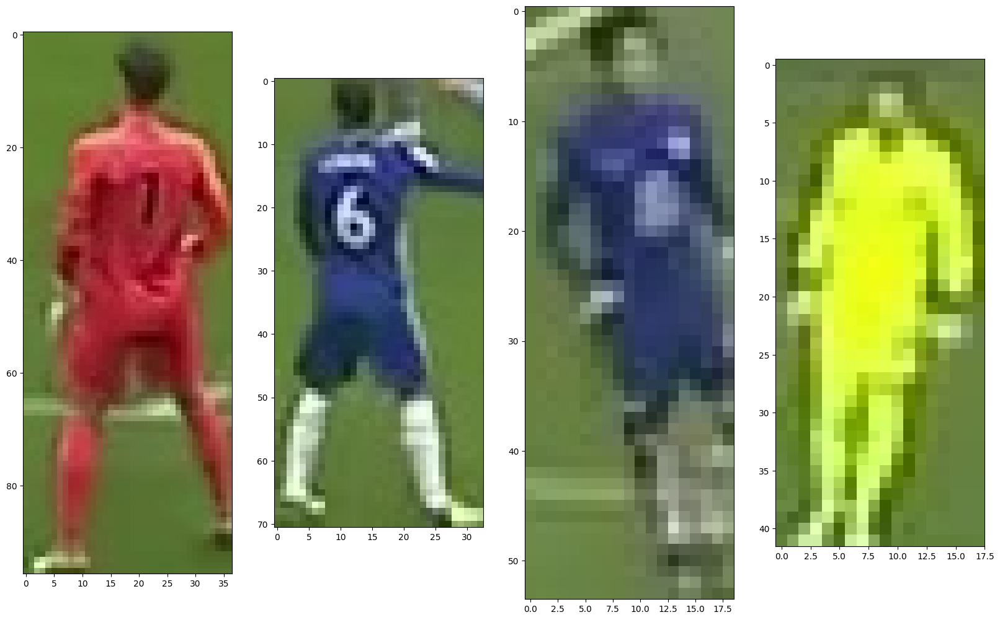

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(20, 20))

for j in range(4):
        top_left = tuple(locals()[f'player_{j}'][1][0])
        bottom_right = tuple(locals()[f'player_{j}'][1][1])
        x1, y1, x2, y2 = top_left[0], top_left[1], bottom_right[0], bottom_right[1]
        region = img_rgb[y1:y2, x1:x2]
        axs[j].imshow(region)

This training data will also useful for the classification between players, though it needs to be a combination of two methods. As mentioned, we are able to mostly correctly classify and track players by calculating the distance between bounding boxes with an updated decision-making algorithm. However, when the overlapped players are all undetected, the classification beginning the next iteration will be all wrong. One solution is that we can depend on CNN when differencing is insufficient to make a correct decision. For example, when two players get overlapped and both bounding boxes disappear for several frames, and further suppose these are the only two players overlapped who are undetected at the moment, we apply CNN by training a model using the cropped images of inside the bounding boxes to assist the classification task. This is easy to automate, since when bounding boxes disappear, we append "None" to the list. Therefore, we apply CNN for players who have "None" in the current. Given that usually 3-4 may be missing on average in a frame, this will simply be a CNN with a MNL output layer.

For key point detection, we will try to replicate and implement models in the following GitHub Repo: https://github.com/UniBwTAS/YOLOPoint.git